# **Assignment 02: Object Detection**

**Available:** Aug 26, 2025 until Sep 4, 2025 11:59pm

## Tasks:

1. Object Detection- refer to slides 8/26/2025 class
2. https://www.kaggle.com/datasets/awsaf49/coco-2017-dataset
3. Run detection performance comparing (inference only):
    - Faster R-CNN
    - DETR
    - DINO
    - Grounding DINO (use text prompt at your discretion)
4. Grading Criteria:
    - Report
    - Code
    - Video
    - Insight


## **Import Packages and Setup**

In [6]:
## Import Libraries

# Set CUDA_VISIBLE_DEVICES to make both GPUs visible
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0,1'

# Install all packages for from the requirements.txt
%pip install -r requirements.txt

import torch
import torch.nn as nn
import torchvision
import cv2
import matplotlib.pyplot as plt
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms
from torch import optim
from tqdm.notebook import tqdm
from torchinfo import summary
import einops
import PIL
import numpy as np
import pandas as pd
# Use a pipeline as a high-level helper
from transformers import pipeline
import time
import psutil
import gc
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import json
from collections import defaultdict
import numpy as np

# Authorize Huggingface account
from dotenv import load_dotenv
import os

# Load environment variables from .env file
load_dotenv('/mnt/Storage02/SoftwareDev/CAP_6411_Assignments/.env')

# Get Hugging Face token
hf_token = os.getenv('HUGGINGFACE_HUB_TOKEN') or os.getenv('HF_TOKEN')

if hf_token:
    print("Found Hugging Face token in environment variables")
    
    
    from huggingface_hub import login, whoami
    
    try:
        # Login to Hugging Face Hub
        login(token=hf_token)
        
        # Verify login by getting user info
        user_info = whoami()
        print(f"Successfully authenticated with Hugging Face!")
        print(f"Logged in as: {user_info['name']}")
        
        # Set the token as environment variable for other libraries
        os.environ['HUGGINGFACE_HUB_TOKEN'] = hf_token
        os.environ['HF_TOKEN'] = hf_token
        
    except Exception as e:
        print(f"Authentication failed: {e}")
        print("Will proceed without pre-trained models if needed")
        hf_token = None
else:
    print("No Hugging Face token found in .env file")
    print("Please add HUGGINGFACE_HUB_TOKEN=your_token_here to your .env file")
    hf_token = None

# Comprehensive GPU diagnostics
print("\n=== GPU Diagnostics ===")
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"CUDA version: {torch.version.cuda}")
print(f"Number of GPUs detected: {torch.cuda.device_count()}")

if torch.cuda.is_available():
    print("\n=== All Available GPUs ===")
    for i in range(torch.cuda.device_count()):
        props = torch.cuda.get_device_properties(i)
        print(f"GPU {i}:")
        print(f"  Name: {props.name}")
        print(f"  Total Memory: {props.total_memory / 1024**3:.2f} GB")
        print(f"  Multi-processor count: {props.multi_processor_count}")
        print(f"  Compute Capability: {props.major}.{props.minor}")
        print()

# Device selection with preference for cuda:1 (A6000) -> cuda:0 (4090) -> cpu
if torch.cuda.is_available() and torch.cuda.device_count() > 1:
    device = torch.device('cuda:1')  # This should now be your A6000!
    print(f"Using GPU 1: {torch.cuda.get_device_name(1)}")
elif torch.cuda.is_available():
    device = torch.device('cuda:0')
    print(f"Using GPU 0: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device('cpu')
    print("Using CPU")

print(f"Selected device: {device}")

# If no logs folder exists, create one
if not os.path.exists("logs"):
    os.makedirs("logs")

# If no checkpoints folder exists, create one
if not os.path.exists("checkpoints"):
    os.makedirs("checkpoints")

# If no data folder exists, create one
if not os.path.exists("data"):
    os.makedirs("data")

def get_memory_usage():
    """Get current memory usage in MB"""
    process = psutil.Process()
    return process.memory_info().rss / 1024 / 1024

def get_gpu_memory_usage():
    """Get current GPU memory usage in MB"""
    if torch.cuda.is_available():
        return torch.cuda.memory_allocated() / 1024 / 1024
    return 0

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Found Hugging Face token in environment variables
Found Hugging Face token in environment variables


Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


Successfully authenticated with Hugging Face!
Logged in as: malneyugnfl

=== GPU Diagnostics ===
PyTorch version: 2.8.0+cu128
CUDA available: True
CUDA version: 12.8
Number of GPUs detected: 1

=== All Available GPUs ===
GPU 0:
  Name: NVIDIA GeForce RTX 4090 Laptop GPU
  Total Memory: 15.70 GB
  Multi-processor count: 76
  Compute Capability: 8.9

Using GPU 0: NVIDIA GeForce RTX 4090 Laptop GPU
Selected device: cuda:0


## **Import and Process Data**

In [7]:
# Import Dataset and Process it

import json
from PIL import Image
from torch.utils.data import Dataset
import os

class CocoDataset(Dataset):
    """
    Custom PyTorch Dataset class for loading COCO 2017 data.
    
    This class handles loading images and their corresponding annotations from the COCO dataset,
    making it compatible with PyTorch DataLoaders and various object detection models.
    """
    
    def __init__(self, root_dir, split="val2017", annotation_type="instances", transform=None, return_coco=False):
        """
        Initialize the COCO dataset.
        
        Args:
            root_dir (str): Path to the COCO dataset root directory (should contain 'annotations', 'train2017', 'val2017', etc.)
            split (str): Dataset split - one of 'train2017', 'val2017', or 'test2017'
            annotation_type (str): Type of annotations - 'instances', 'captions', or 'person_keypoints'
            transform (callable, optional): Transform to apply to images and targets
            return_coco (bool): If True, also return the raw COCO annotation dict for each sample
        """
        # Store initialization parameters
        self.root_dir = root_dir
        self.split = split
        self.transform = transform
        self.return_coco = return_coco
        
        # Set up image directory path
        self.img_dir = os.path.join(root_dir, split)
        self.annotation_type = annotation_type
        
        # Handle test split (which has no annotations)
        if split == "test2017":
            self.annotations = None
            # For test set, just get list of image filenames
            self.imgs = sorted(os.listdir(self.img_dir))
        else:
            # Load annotation file for train/val splits
            ann_file = os.path.join(
                root_dir, "annotations", f"{annotation_type}_{split}.json"
            )
            
            # Load COCO annotations JSON file
            with open(ann_file, "r") as f:
                self.coco = json.load(f)
            
            # Extract images and annotations from COCO data
            self.imgs = self.coco["images"]  # List of image metadata
            self.anns = self.coco["annotations"]  # List of annotation objects
            
            # Create mapping from image_id to list of annotations for that image
            # This allows fast lookup of annotations for a given image
            self.imgid_to_anns = {}
            for ann in self.anns:
                img_id = ann["image_id"]
                if img_id not in self.imgid_to_anns:
                    self.imgid_to_anns[img_id] = []
                self.imgid_to_anns[img_id].append(ann)
            
            # Create mapping from image_id to filename for easy access
            self.imgid_to_filename = {img["id"]: img["file_name"] for img in self.imgs}
            
            # Create mapping from category_id to category name (useful for visualization)
            self.catid_to_name = {cat["id"]: cat["name"] for cat in self.coco.get("categories", [])}

    def __len__(self):
        """Return the total number of images in the dataset."""
        return len(self.imgs)

    def __getitem__(self, idx):
        """
        Get a single sample from the dataset.
        
        Args:
            idx (int): Index of the sample to retrieve
            
        Returns:
            tuple: (image, target) where:
                - image: PIL Image or transformed tensor
                - target: Dictionary containing bounding boxes, labels, and other metadata
        """
        
        # Handle test split (no annotations available)
        if self.split == "test2017":
            img_name = self.imgs[idx]
            img_path = os.path.join(self.img_dir, img_name)
            image = Image.open(img_path).convert("RGB")
            target = {}  # Empty target for test images
        else:
            # Get image metadata and construct path
            img_info = self.imgs[idx]
            img_id = img_info["id"]
            img_name = img_info["file_name"]
            img_path = os.path.join(self.img_dir, img_name)
            
            # Load image and convert to RGB
            image = Image.open(img_path).convert("RGB")
            
            # Get all annotations for this image
            anns = self.imgid_to_anns.get(img_id, [])
            
            # Extract bounding box and label information from annotations
            boxes = []      # Bounding boxes in [x, y, width, height] format
            labels = []     # Category IDs for each object
            areas = []      # Area of each bounding box
            iscrowd = []    # Whether each annotation represents a crowd of objects
            
            for ann in anns:
                # Only process annotations that have bounding boxes
                if "bbox" in ann:
                    boxes.append(ann["bbox"])  # COCO format: [x, y, width, height]
                    labels.append(ann["category_id"])
                    areas.append(ann.get("area", 0))
                    iscrowd.append(ann.get("iscrowd", 0))
            
            # Create target dictionary in PyTorch format
            # Convert lists to tensors, handling empty cases
            target = {
                "boxes": torch.tensor(boxes, dtype=torch.float32) if boxes else torch.zeros((0,4), dtype=torch.float32),
                "labels": torch.tensor(labels, dtype=torch.int64) if labels else torch.zeros((0,), dtype=torch.int64),
                "image_id": torch.tensor([img_id]),  # Unique identifier for this image
                "area": torch.tensor(areas, dtype=torch.float32) if areas else torch.zeros((0,), dtype=torch.float32),
                "iscrowd": torch.tensor(iscrowd, dtype=torch.int64) if iscrowd else torch.zeros((0,), dtype=torch.int64),
            }
        
        # Apply transforms if provided (e.g., normalization, resizing)
        if self.transform:
            image = self.transform(image)
        
        # Optionally return raw COCO annotations along with processed data
        if self.return_coco and self.split != "test2017":
            return image, target, anns
        
        return image, target

# Example usage:
# Create a dataset instance
# dataset = CocoDataset(
#     root_dir="data/coco2017",              # Path to COCO dataset
#     split="val2017",                       # Use validation split
#     annotation_type="instances",           # Object detection annotations
#     transform=transforms.ToTensor(),       # Convert PIL Images to tensors
# )
# 
# # Get a single sample
# img, target = dataset[0]
# print(f"Image shape: {img.shape}")
# print(f"Number of objects: {len(target['labels'])}")
# print(f"Object categories: {target['labels']}")
# print(f"Bounding boxes: {target['boxes']}")
#
# # Use with DataLoader for batching
# from torch.utils.data import DataLoader
# dataloader = DataLoader(dataset, batch_size=4, shuffle=True)
# for batch_imgs, batch_targets in dataloader:
#     # Process batch
#     break

In [8]:
# Create Instance of dataset for inference

# COCO class names for visualization
COCO_CLASSES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

# Define transforms for inference (normalize to match model expectations)
inference_transform = transforms.Compose([
    transforms.ToTensor(),  # Convert PIL Image to tensor and scale to [0,1]
    # Note: Different models may need different normalization
    # We'll apply model-specific transforms during inference
])

# Create dataset instance pointing to the COCO 2017 validation set
coco_dataset = CocoDataset(
    root_dir="data/coco2017",           # Path to COCO dataset
    split="val2017",                    # Use validation split for inference
    annotation_type="instances",        # Object detection annotations
    transform=inference_transform,      # Apply transforms
    return_coco=False                   # Don't need raw COCO annotations for inference
)

print(f"Dataset loaded successfully!")
print(f"Number of images in validation set: {len(coco_dataset)}")
print(f"Available categories: {len(coco_dataset.catid_to_name)} classes")

# Define a proper collate function that can be pickled
def collate_fn(batch):
    """
    Custom collate function for object detection.
    Since we're using batch_size=1, this just returns the batch as-is.
    """
    return batch

# Create DataLoader for batched inference
# Using batch_size=1 for inference to avoid complications with variable-sized images
inference_dataloader = DataLoader(
    coco_dataset,
    batch_size=1,                       # Process one image at a time
    shuffle=False,                      # No need to shuffle for inference
    num_workers=0,                      # Set to 0 to avoid pickling issues with custom classes
    collate_fn=collate_fn,             # Use proper function instead of lambda
    pin_memory=True if torch.cuda.is_available() else False  # Speed up GPU transfer
)

print(f"DataLoader created with batch size: {inference_dataloader.batch_size}")
print(f"Number of batches: {len(inference_dataloader)}")

# Test loading a single sample to verify everything works
print("\n=== Testing dataset loading ===")
try:
    sample_image, sample_target = coco_dataset[0]
    print(f"Sample loaded successfully!")
    print(f"Image shape: {sample_image.shape}")
    print(f"Image dtype: {sample_image.dtype}")
    print(f"Number of objects in image: {len(sample_target['labels'])}")
    print(f"Object categories in image: {sample_target['labels'].tolist()}")
    print(f"Image ID: {sample_target['image_id'].item()}")
    
    # Show some category names if available
    if len(sample_target['labels']) > 0:
        print("Category names:")
        for label in sample_target['labels'][:5]:  # Show first 5 categories
            cat_name = coco_dataset.catid_to_name.get(label.item(), f"Unknown ({label.item()})")
            print(f"  - {cat_name}")
            
except Exception as e:
    print(f"Error loading sample: {e}")

# Test DataLoader iteration
print("\n=== Testing DataLoader ===")
try:
    # Get first batch
    first_batch = next(iter(inference_dataloader))
    image, target = first_batch[0]  # Extract from list since batch_size=1
    print(f"DataLoader working correctly!")
    print(f"Batch image shape: {image.shape}")
    print(f"Batch target keys: {list(target.keys())}")
    
except Exception as e:
    print(f"Error with DataLoader: {e}")

Dataset loaded successfully!
Number of images in validation set: 5000
Available categories: 80 classes
DataLoader created with batch size: 1
Number of batches: 5000

=== Testing dataset loading ===
Sample loaded successfully!
Image shape: torch.Size([3, 427, 640])
Image dtype: torch.float32
Number of objects in image: 19
Object categories in image: [44, 67, 1, 49, 51, 51, 79, 1, 47, 47, 51, 51, 56, 50, 56, 56, 79, 57, 81]
Image ID: 397133
Category names:
  - bottle
  - dining table
  - person
  - knife
  - bowl

=== Testing DataLoader ===
DataLoader working correctly!
Batch image shape: torch.Size([3, 427, 640])
Batch target keys: ['boxes', 'labels', 'image_id', 'area', 'iscrowd']


## **Faster R-CNN**

### Import Faster R-CNN

In [19]:
# Load Faster R-CNN model
from torchvision.models import detection
import torchvision.transforms as T

# Load pre-trained Faster R-CNN model with ResNet-50 backbone
faster_rcnn = detection.fasterrcnn_resnet50_fpn(pretrained=True)
faster_rcnn.eval()  # Set to evaluation mode
faster_rcnn = faster_rcnn.to(device)


/home/malneyugnfl/anaconda3/envs/huggingface/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/malneyugnfl/anaconda3/envs/huggingface/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


### Perform Inference and Measure Performance Metrics for Faster R-CNN

In [ ]:
# Faster R-CNN Inference with Performance Metrics




def faster_rcnn_inference(model, image_tensor, confidence_threshold=0.5):
    """
    Perform inference with Faster R-CNN
    
    Args:
        model: Faster R-CNN model
        image_tensor: Input image tensor [C, H, W]
        confidence_threshold: Minimum confidence score for detections
    
    Returns:
        dict: Detection results with boxes, labels, scores
    """
    # Ensure image is in the right format [1, C, H, W]
    if image_tensor.dim() == 3:
        image_tensor = image_tensor.unsqueeze(0)
    
    # Move to device
    image_tensor = image_tensor.to(device)
    
    # Inference
    with torch.no_grad():
        predictions = model(image_tensor)
    
    # Extract results from the first (and only) image in batch
    pred = predictions[0]
    
    # Filter by confidence threshold
    valid_detections = pred['scores'] >= confidence_threshold
    
    return {
        'boxes': pred['boxes'][valid_detections].cpu(),
        'labels': pred['labels'][valid_detections].cpu(),
        'scores': pred['scores'][valid_detections].cpu()
    }

def convert_to_coco_format(image_id, detections):
    """
    Convert model predictions to COCO evaluation format
    
    Args:
        image_id: COCO image ID
        detections: Detection results from model
    
    Returns:
        list: List of detections in COCO format
    """
    coco_results = []
    
    for i in range(len(detections['boxes'])):
        box = detections['boxes'][i].numpy()
        # Convert from [x1, y1, x2, y2] to [x, y, width, height]
        x1, y1, x2, y2 = box
        width = x2 - x1
        height = y2 - y1
        
        coco_results.append({
            'image_id': int(image_id),
            'category_id': int(detections['labels'][i].item()),
            'bbox': [float(x1), float(y1), float(width), float(height)],
            'score': float(detections['scores'][i].item())
        })
    
    return coco_results

# Initialize performance tracking
print("=== Faster R-CNN Inference and Performance Evaluation ===\n")

# Set up evaluation parameters
CONFIDENCE_THRESHOLD = 0.5
MAX_IMAGES = 100  # Limit for faster evaluation during development
USE_SUBSET = True  # Set to False to evaluate on full validation set

# Performance metrics storage
inference_times = []
memory_usage_before = []
memory_usage_after = []
gpu_memory_before = []
gpu_memory_after = []
total_detections = 0
coco_results = []

# Track overall timing
overall_start_time = time.time()

print(f"Starting inference on {'subset of' if USE_SUBSET else 'full'} COCO validation set...")
print(f"Confidence threshold: {CONFIDENCE_THRESHOLD}")
print(f"Device: {device}")
print(f"Initial CPU Memory: {get_memory_usage():.2f} MB")
print(f"Initial GPU Memory: {get_gpu_memory_usage():.2f} MB")
print()

# Ensure model is in evaluation mode and on correct device
faster_rcnn.eval()
faster_rcnn = faster_rcnn.to(device)

# Create a subset of the dataset for faster evaluation
dataset_subset = coco_dataset if not USE_SUBSET else torch.utils.data.Subset(
    coco_dataset, range(min(MAX_IMAGES, len(coco_dataset)))
)

# Create DataLoader for the subset
subset_dataloader = DataLoader(
    dataset_subset,
    batch_size=1,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn,
    pin_memory=True if torch.cuda.is_available() else False
)

print(f"Processing {len(dataset_subset)} images...")

# Perform inference on dataset
for batch_idx, batch in enumerate(tqdm(subset_dataloader, desc="Faster R-CNN Inference")):
    image, target = batch[0]  # Extract from batch list
    image_id = target['image_id'].item()
    
    # Record memory usage before inference
    mem_before = get_memory_usage()
    gpu_mem_before = get_gpu_memory_usage()
    memory_usage_before.append(mem_before)
    gpu_memory_before.append(gpu_mem_before)
    
    # Time the inference
    start_time = time.time()
    
    # Perform inference
    detections = faster_rcnn_inference(faster_rcnn, image, CONFIDENCE_THRESHOLD)
    
    # Record inference time
    inference_time = time.time() - start_time
    inference_times.append(inference_time)
    
    # Record memory usage after inference
    mem_after = get_memory_usage()
    gpu_mem_after = get_gpu_memory_usage()
    memory_usage_after.append(mem_after)
    gpu_memory_after.append(gpu_mem_after)
    
    # Convert to COCO format for evaluation
    coco_detections = convert_to_coco_format(image_id, detections)
    coco_results.extend(coco_detections)
    
    # Update total detections count
    total_detections += len(detections['boxes'])
    
    # Print progress every 10 images
    if (batch_idx + 1) % 10 == 0:
        avg_time = np.mean(inference_times[-10:])
        print(f"Processed {batch_idx + 1} images, avg time (last 10): {avg_time:.3f}s")

# Calculate overall timing
total_inference_time = time.time() - overall_start_time

print(f"\n=== Faster R-CNN Performance Metrics ===")
print(f"Dataset: COCO 2017 Validation ({'subset' if USE_SUBSET else 'full'})")
print(f"Images processed: {len(dataset_subset)}")
print(f"Total detections: {total_detections}")
print(f"Confidence threshold: {CONFIDENCE_THRESHOLD}")

# Timing metrics
print(f"\n--- Timing Metrics ---")
print(f"Total inference time: {total_inference_time:.2f} seconds")
print(f"Average time per image: {np.mean(inference_times):.3f} ± {np.std(inference_times):.3f} seconds")
print(f"Fastest inference: {np.min(inference_times):.3f} seconds")
print(f"Slowest inference: {np.max(inference_times):.3f} seconds")
print(f"Images per second: {len(dataset_subset) / total_inference_time:.2f}")

# Memory metrics
print(f"\n--- Memory Usage Metrics ---")
print(f"Average CPU memory during inference: {np.mean(memory_usage_after):.2f} MB")
print(f"Peak CPU memory usage: {np.max(memory_usage_after):.2f} MB")
print(f"Average CPU memory increase per inference: {np.mean(np.array(memory_usage_after) - np.array(memory_usage_before)):.2f} MB")

if torch.cuda.is_available():
    print(f"Average GPU memory during inference: {np.mean(gpu_memory_after):.2f} MB")
    print(f"Peak GPU memory usage: {np.max(gpu_memory_after):.2f} MB")
    print(f"Average GPU memory increase per inference: {np.mean(np.array(gpu_memory_after) - np.array(gpu_memory_before)):.2f} MB")

# Detection statistics
print(f"\n--- Detection Statistics ---")
print(f"Average detections per image: {total_detections / len(dataset_subset):.2f}")
scores_all = [det['score'] for det in coco_results]
if scores_all:
    print(f"Average confidence score: {np.mean(scores_all):.3f} ± {np.std(scores_all):.3f}")
    print(f"Confidence score range: {np.min(scores_all):.3f} - {np.max(scores_all):.3f}")

# Save results for COCO evaluation
results_file = f"logs/faster_rcnn_results_{len(dataset_subset)}_images.json"
with open(results_file, 'w') as f:
    json.dump(coco_results, f)
print(f"\nResults saved to: {results_file}")

# Store results for comparison with other models
faster_rcnn_metrics = {
    'model_name': 'Faster R-CNN',
    'total_images': len(dataset_subset),
    'total_detections': total_detections,
    'total_inference_time': total_inference_time,
    'avg_time_per_image': np.mean(inference_times),
    'std_time_per_image': np.std(inference_times),
    'images_per_second': len(dataset_subset) / total_inference_time,
    'avg_cpu_memory': np.mean(memory_usage_after),
    'peak_cpu_memory': np.max(memory_usage_after),
    'avg_gpu_memory': np.mean(gpu_memory_after) if torch.cuda.is_available() else 0,
    'peak_gpu_memory': np.max(gpu_memory_after) if torch.cuda.is_available() else 0,
    'avg_detections_per_image': total_detections / len(dataset_subset),
    'avg_confidence': np.mean(scores_all) if scores_all else 0,
    'confidence_threshold': CONFIDENCE_THRESHOLD
}

print(f"\n=== Summary for Faster R-CNN ===")
print(f"✓ Processed {len(dataset_subset)} images in {total_inference_time:.2f} seconds")
print(f"✓ Average inference speed: {len(dataset_subset) / total_inference_time:.2f} images/second")
print(f"✓ Average detections per image: {total_detections / len(dataset_subset):.2f}")
print(f"✓ Results saved for COCO evaluation")

# Clean up GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()
gc.collect()

print(f"\n✓ Faster R-CNN inference completed successfully!")

=== Faster R-CNN Inference and Performance Evaluation ===

Starting inference on subset of COCO validation set...
Confidence threshold: 0.5
Device: cuda:1
Initial CPU Memory: 2929.73 MB
Initial GPU Memory: 0.00 MB

Processing 100 images...


Faster R-CNN Inference:   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10 images, avg time (last 10): 0.037s
Processed 20 images, avg time (last 10): 0.030s
Processed 20 images, avg time (last 10): 0.030s
Processed 30 images, avg time (last 10): 0.031s
Processed 30 images, avg time (last 10): 0.031s
Processed 40 images, avg time (last 10): 0.029s
Processed 40 images, avg time (last 10): 0.029s
Processed 50 images, avg time (last 10): 0.029s
Processed 50 images, avg time (last 10): 0.029s
Processed 60 images, avg time (last 10): 0.029s
Processed 60 images, avg time (last 10): 0.029s
Processed 70 images, avg time (last 10): 0.030s
Processed 70 images, avg time (last 10): 0.030s
Processed 80 images, avg time (last 10): 0.029s
Processed 80 images, avg time (last 10): 0.029s
Processed 90 images, avg time (last 10): 0.029s
Processed 90 images, avg time (last 10): 0.029s
Processed 100 images, avg time (last 10): 0.029s

=== Faster R-CNN Performance Metrics ===
Dataset: COCO 2017 Validation (subset)
Images processed: 100
Total detections: 940
Confidence


=== COCO Evaluation Metrics ===
loading annotations into memory...
Done (t=0.26s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.11s).
Accumulating evaluation results...
Done (t=0.26s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.11s).
Accumulating evaluation results...
DONE (t=0.11s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.427
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.600
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.486
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.267
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.483
 Average Precision  (AP) @[ 

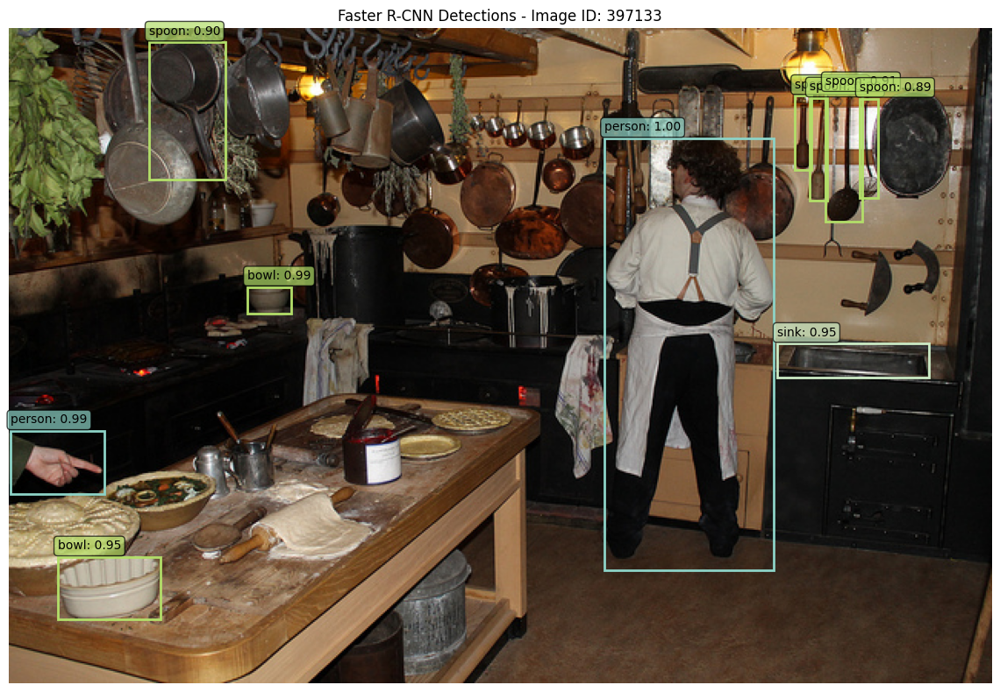


Image 2 (ID: 37777) - 17 detections


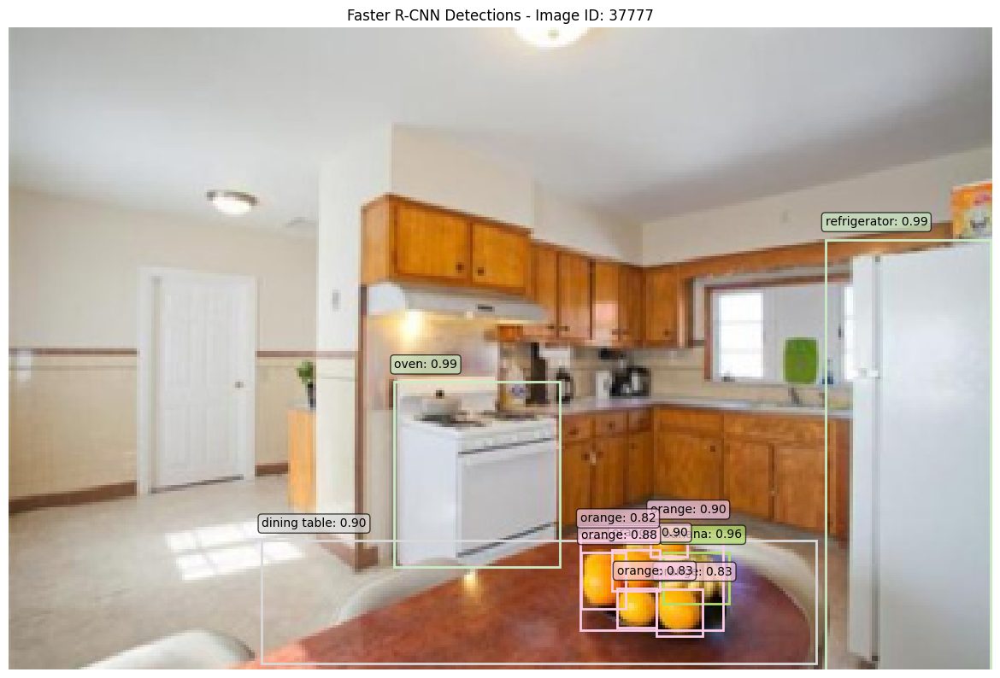


Image 3 (ID: 252219) - 11 detections


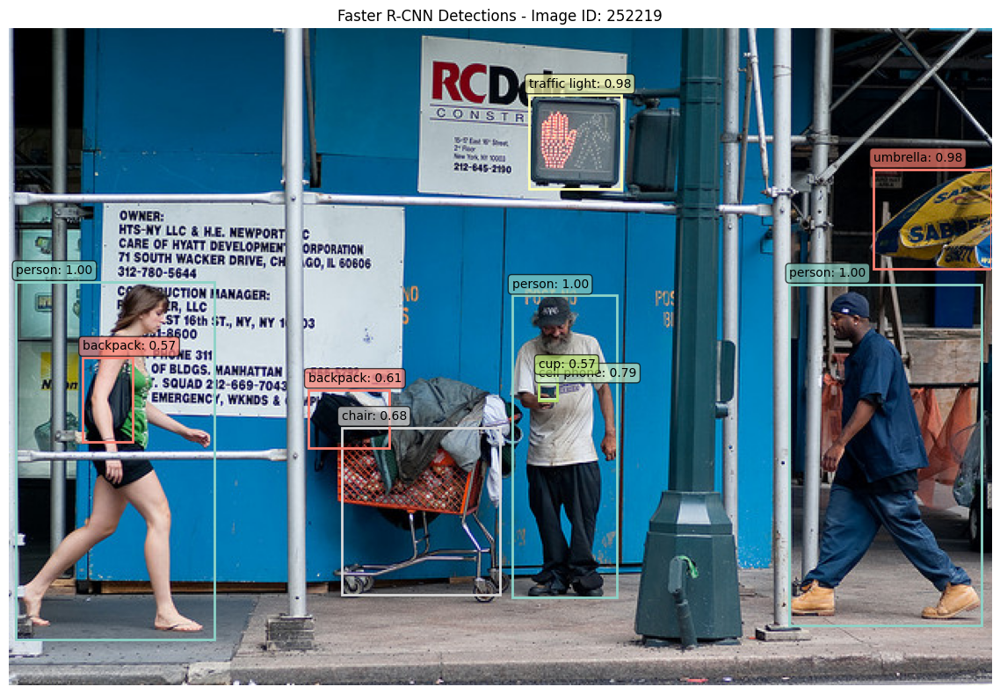


=== Faster R-CNN Evaluation Complete ===
All metrics and visualizations generated successfully!


In [21]:
# COCO Evaluation and Visualization

# Perform COCO evaluation if ground truth annotations are available
def evaluate_with_coco_metrics(results_file, annotation_file):
    """
    Evaluate detection results using COCO metrics
    
    Args:
        results_file: Path to JSON file with detection results
        annotation_file: Path to COCO ground truth annotations
    
    Returns:
        dict: COCO evaluation metrics
    """
    try:
        # Load COCO ground truth
        coco_gt = COCO(annotation_file)
        
        # Load detection results
        coco_dt = coco_gt.loadRes(results_file)
        
        # Create evaluator
        coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
        
        # Restrict evaluation to subset of images if we only processed a subset
        if USE_SUBSET:
            img_ids = list(coco_gt.imgs.keys())[:MAX_IMAGES]
            coco_eval.params.imgIds = img_ids
        
        # Run evaluation
        coco_eval.evaluate()
        coco_eval.accumulate()
        coco_eval.summarize()
        
        # Extract metrics
        metrics = {
            'AP_all': coco_eval.stats[0],  # AP @ IoU=0.50:0.95
            'AP_50': coco_eval.stats[1],   # AP @ IoU=0.50
            'AP_75': coco_eval.stats[2],   # AP @ IoU=0.75
            'AP_small': coco_eval.stats[3], # AP for small objects
            'AP_medium': coco_eval.stats[4], # AP for medium objects
            'AP_large': coco_eval.stats[5], # AP for large objects
            'AR_1': coco_eval.stats[6],    # AR @ 1 detection per image
            'AR_10': coco_eval.stats[7],   # AR @ 10 detections per image
            'AR_100': coco_eval.stats[8],  # AR @ 100 detections per image
            'AR_small': coco_eval.stats[9], # AR for small objects
            'AR_medium': coco_eval.stats[10], # AR for medium objects
            'AR_large': coco_eval.stats[11]  # AR for large objects
        }
        
        return metrics
        
    except Exception as e:
        print(f"COCO evaluation failed: {e}")
        return None

# Try to perform COCO evaluation
print("\n=== COCO Evaluation Metrics ===")
annotation_file = "data/coco2017/annotations/instances_val2017.json"
if os.path.exists(annotation_file):
    try:
        coco_metrics = evaluate_with_coco_metrics(results_file, annotation_file)
        if coco_metrics:
            print("COCO Evaluation Results for Faster R-CNN:")
            print(f"Average Precision (AP) @ IoU=0.50:0.95: {coco_metrics['AP_all']:.3f}")
            print(f"Average Precision (AP) @ IoU=0.50: {coco_metrics['AP_50']:.3f}")
            print(f"Average Precision (AP) @ IoU=0.75: {coco_metrics['AP_75']:.3f}")
            print(f"Average Precision (AP) for small objects: {coco_metrics['AP_small']:.3f}")
            print(f"Average Precision (AP) for medium objects: {coco_metrics['AP_medium']:.3f}")
            print(f"Average Precision (AP) for large objects: {coco_metrics['AP_large']:.3f}")
            print(f"Average Recall (AR) @ 100 detections: {coco_metrics['AR_100']:.3f}")
            
            # Add COCO metrics to stored results
            faster_rcnn_metrics.update(coco_metrics)
        else:
            print("COCO evaluation could not be completed")
    except Exception as e:
        print(f"Error during COCO evaluation: {e}")
else:
    print(f"Ground truth annotations not found at: {annotation_file}")
    print("Skipping COCO evaluation")

# Visualize sample detections
def visualize_detections(image_tensor, detections, image_id, max_detections=10):
    """
    Visualize detection results on an image
    
    Args:
        image_tensor: Input image tensor [C, H, W]
        detections: Detection results from model
        image_id: Image ID for title
        max_detections: Maximum number of detections to show
    """
    # Convert tensor to numpy array for visualization
    if isinstance(image_tensor, torch.Tensor):
        # Handle tensor format [C, H, W] -> [H, W, C]
        if image_tensor.dim() == 4:
            image_tensor = image_tensor.squeeze(0)
        
        image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
        
        # Ensure values are in [0, 1] range
        if image_np.max() <= 1.0:
            image_np = (image_np * 255).astype(np.uint8)
        else:
            image_np = image_np.astype(np.uint8)
    else:
        image_np = image_tensor
    
    # Create figure
    plt.figure(figsize=(12, 8))
    plt.imshow(image_np)
    plt.axis('off')
    plt.title(f'Faster R-CNN Detections - Image ID: {image_id}')
    
    # Draw bounding boxes
    boxes = detections['boxes'][:max_detections]
    labels = detections['labels'][:max_detections]
    scores = detections['scores'][:max_detections]
    
    colors = plt.cm.Set3(np.linspace(0, 1, len(COCO_CLASSES)))
    
    for i, (box, label, score) in enumerate(zip(boxes, labels, scores)):
        x1, y1, x2, y2 = box.numpy()
        width = x2 - x1
        height = y2 - y1
        
        # Get class name and color
        class_name = COCO_CLASSES[label] if label < len(COCO_CLASSES) else f'Class_{label}'
        color = colors[label % len(colors)]
        
        # Draw bounding box
        rect = plt.Rectangle((x1, y1), width, height, 
                           linewidth=2, edgecolor=color, facecolor='none')
        plt.gca().add_patch(rect)
        
        # Add label with confidence score
        plt.text(x1, y1 - 5, f'{class_name}: {score:.2f}', 
                bbox=dict(boxstyle='round,pad=0.3', facecolor=color, alpha=0.7),
                fontsize=10, color='black')
    
    plt.tight_layout()
    plt.show()

# Show sample detections from the first few images
print(f"\n=== Sample Detection Visualizations ===")
print("Showing detection results from first 3 images...")

# Get a few sample images for visualization
sample_indices = [0, 1, 2]  # First 3 images
for idx in sample_indices:
    try:
        # Get image and target
        image, target = dataset_subset[idx]
        image_id = target['image_id'].item()
        
        # Perform inference for visualization
        with torch.no_grad():
            detections = faster_rcnn_inference(faster_rcnn, image, CONFIDENCE_THRESHOLD)
        
        # Visualize
        print(f"\nImage {idx + 1} (ID: {image_id}) - {len(detections['boxes'])} detections")
        visualize_detections(image, detections, image_id)
        
    except Exception as e:
        print(f"Error visualizing image {idx}: {e}")

print(f"\n=== Faster R-CNN Evaluation Complete ===")
print(f"All metrics and visualizations generated successfully!")

## **DinoV3**

### Import DinoV3 Model

In [1]:
import torch
from transformers import AutoImageProcessor, AutoModel
from transformers.image_utils import load_image
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import requests

# Load image from URL
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = load_image(url)

print("=== Loading DinoV3 Model ===")
print("Model: facebook/dinov3-vit7b16-pretrain-lvd1689m")

pretrained_model_name = "facebook/dinov3-vit7b16-pretrain-lvd1689m"
processor = AutoImageProcessor.from_pretrained(pretrained_model_name)
model = AutoModel.from_pretrained(
    pretrained_model_name, 
    device_map="auto", 
)

# Set model to evaluation mode
model.eval()

print(f"Model loaded successfully on device: {model.device}")
print(f"Model configuration: {model.config}")

# Process the image
inputs = processor(images=image, return_tensors="pt").to(model.device)
print(f"Input tensor shape: {inputs.pixel_values.shape}")


=== Loading DinoV3 Model ===
Model: facebook/dinov3-vit7b16-pretrain-lvd1689m


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/6 [00:00<?, ?it/s]

Some parameters are on the meta device because they were offloaded to the cpu.


Model loaded successfully on device: cuda:0
Model configuration: DINOv3ViTConfig {
  "architectures": [
    "DINOv3ViTModel"
  ],
  "attention_dropout": 0.0,
  "drop_path_rate": 0.0,
  "dtype": "float32",
  "hidden_act": "silu",
  "hidden_size": 4096,
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 8192,
  "key_bias": false,
  "layer_norm_eps": 1e-05,
  "layerscale_value": 1.0,
  "mlp_bias": true,
  "model_type": "dinov3_vit",
  "num_attention_heads": 32,
  "num_channels": 3,
  "num_hidden_layers": 40,
  "num_register_tokens": 4,
  "patch_size": 16,
  "pos_embed_jitter": null,
  "pos_embed_rescale": 2.0,
  "pos_embed_shift": null,
  "proj_bias": true,
  "query_bias": false,
  "rope_theta": 100.0,
  "transformers_version": "4.56.0",
  "use_gated_mlp": true,
  "value_bias": false
}

Input tensor shape: torch.Size([1, 3, 224, 224])


In [2]:

# Perform inference and get all outputs
with torch.inference_mode():
    outputs = model(**inputs, output_hidden_states=True, output_attentions=True)

# Extract different types of outputs
pooled_output = outputs.pooler_output
last_hidden_state = outputs.last_hidden_state
hidden_states = outputs.hidden_states if hasattr(outputs, 'hidden_states') else None
attentions = outputs.attentions if hasattr(outputs, 'attentions') else None

print("=== DinoV3 Output Analysis ===")
print(f"Pooled output shape: {pooled_output.shape}")
print(f"Last hidden state shape: {last_hidden_state.shape}")

if hidden_states:
    print(f"Number of hidden layers: {len(hidden_states)}")
    print(f"Hidden state shapes: {[h.shape for h in hidden_states[:3]]}...")  # Show first 3

if attentions:
    print(f"Number of attention layers: {len(attentions)}")
    print(f"Attention shapes: {[a.shape for a in attentions[:3]]}...")  # Show first 3



=== DinoV3 Output Analysis ===
Pooled output shape: torch.Size([1, 4096])
Last hidden state shape: torch.Size([1, 201, 4096])
Number of hidden layers: 41
Hidden state shapes: [torch.Size([1, 201, 4096]), torch.Size([1, 201, 4096]), torch.Size([1, 201, 4096])]...



=== Visualizing DinoV3 Feature Maps ===
Debug: last_hidden_state shape: torch.Size([1, 201, 4096])
Debug: num_spatial_patches: 200, patch_size: 14
Debug: spatial_features shape after removing CLS: torch.Size([200, 4096])
Debug: Using 196 patches for visualization


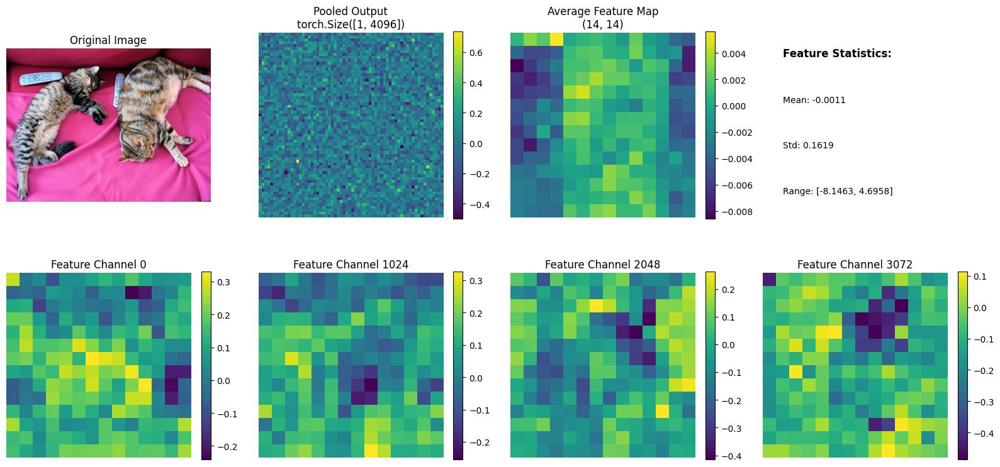


=== Analyzing Patch Similarities ===


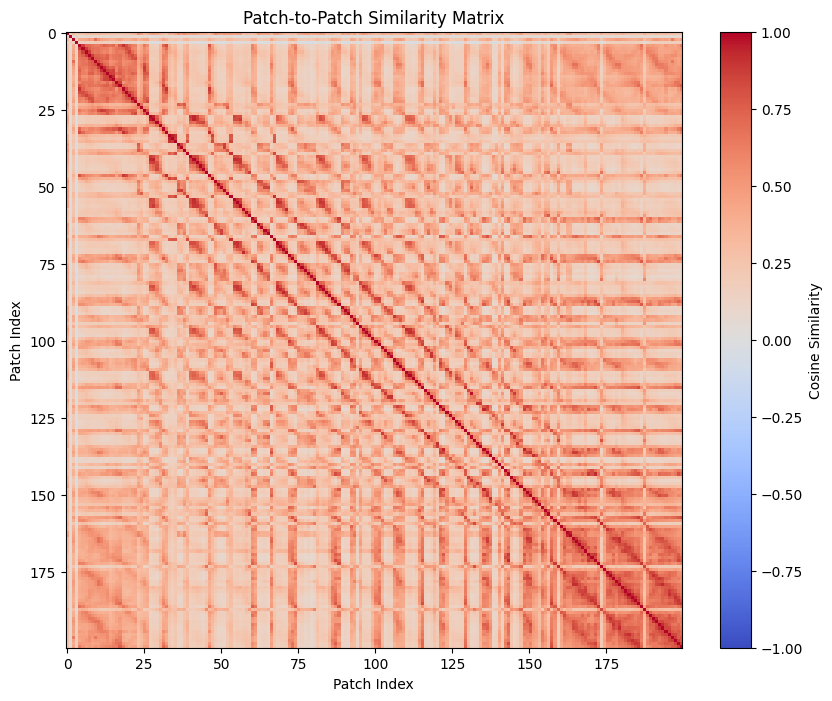


=== DinoV3 Feature Analysis Summary ===
Input image size: (640, 480)
Number of patches: 200
Feature dimension: 4096
Pooled output shape: torch.Size([1, 4096])
Average patch similarity: 0.3452
Feature map statistics: {'mean': -0.0010786560596898198, 'std': 0.1618553102016449, 'min': -8.146312713623047, 'max': 4.695764541625977}


In [ ]:
# Visualize the original image and feature maps
def visualize_feature_maps(image, last_hidden_state, pooled_output, num_patches_to_show=16):
    """
    Visualize DinoV3 feature maps and outputs
    """
    # Convert image to numpy for visualization
    if isinstance(image, Image.Image):
        image_np = np.array(image)
    else:
        image_np = image
    
    # Get dimensions
    batch_size, num_patches, hidden_dim = last_hidden_state.shape
    print(f"Debug: last_hidden_state shape: {last_hidden_state.shape}")
    
    # Calculate patch grid size (assuming square patches)
    # For DinoV3, we need to account for the CLS token
    num_spatial_patches = num_patches - 1  # Remove CLS token
    patch_size = int(np.sqrt(num_spatial_patches))
    print(f"Debug: num_spatial_patches: {num_spatial_patches}, patch_size: {patch_size}")
    
    # Remove CLS token and reshape to spatial grid
    # DinoV3 uses CLS token as first token
    spatial_features = last_hidden_state[0, 1:, :]  # Remove CLS token
    print(f"Debug: spatial_features shape after removing CLS: {spatial_features.shape}")
    
    # Check if we can reshape perfectly into a square
    if patch_size * patch_size != num_spatial_patches:
        print(f"Warning: Cannot reshape {num_spatial_patches} patches into perfect square. Using closest square.")
        # Use the largest square that fits
        actual_patches_to_use = patch_size * patch_size
        spatial_features = spatial_features[:actual_patches_to_use, :]
        print(f"Debug: Using {actual_patches_to_use} patches for visualization")
    
    spatial_features = spatial_features.reshape(patch_size, patch_size, hidden_dim)
    
    # Create visualization
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    
    # Original image
    axes[0, 0].imshow(image_np)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    
    # Pooled output visualization (reshape for visualization)
    pooled_reshaped = pooled_output[0].cpu().numpy()
    # Create a square visualization of pooled output
    pooled_dim = int(np.sqrt(len(pooled_reshaped)))
    if pooled_dim * pooled_dim == len(pooled_reshaped):
        pooled_2d = pooled_reshaped.reshape(pooled_dim, pooled_dim)
    else:
        # If not square, pad or truncate to make it square
        target_size = int(np.sqrt(len(pooled_reshaped)))
        pooled_2d = pooled_reshaped[:target_size*target_size].reshape(target_size, target_size)
    
    im1 = axes[0, 1].imshow(pooled_2d, cmap='viridis')
    axes[0, 1].set_title(f'Pooled Output\n{pooled_output.shape}')
    axes[0, 1].axis('off')
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046)
    
    # Average feature map across all dimensions
    avg_features = spatial_features.mean(dim=-1).cpu().numpy()
    im2 = axes[0, 2].imshow(avg_features, cmap='viridis')
    axes[0, 2].set_title(f'Average Feature Map\n{avg_features.shape}')
    axes[0, 2].axis('off')
    plt.colorbar(im2, ax=axes[0, 2], fraction=0.046)
    
    # Feature map statistics
    feature_stats = {
        'mean': spatial_features.mean().item(),
        'std': spatial_features.std().item(),
        'min': spatial_features.min().item(),
        'max': spatial_features.max().item()
    }
    
    axes[0, 3].text(0.1, 0.8, f"Feature Statistics:", fontsize=12, fontweight='bold')
    axes[0, 3].text(0.1, 0.6, f"Mean: {feature_stats['mean']:.4f}", fontsize=10)
    axes[0, 3].text(0.1, 0.4, f"Std: {feature_stats['std']:.4f}", fontsize=10)
    axes[0, 3].text(0.1, 0.2, f"Range: [{feature_stats['min']:.4f}, {feature_stats['max']:.4f}]", fontsize=10)
    axes[0, 3].set_xlim(0, 1)
    axes[0, 3].set_ylim(0, 1)
    axes[0, 3].axis('off')
    
    # Show individual feature channels
    feature_channels = [0, hidden_dim//4, hidden_dim//2, 3*hidden_dim//4]
    for i, channel in enumerate(feature_channels):
        if channel < hidden_dim:
            channel_map = spatial_features[:, :, channel].cpu().numpy()
            im = axes[1, i].imshow(channel_map, cmap='viridis')
            axes[1, i].set_title(f'Feature Channel {channel}')
            axes[1, i].axis('off')
            plt.colorbar(im, ax=axes[1, i], fraction=0.046)
    
    plt.tight_layout()
    plt.show()
    
    return feature_stats

# Visualize feature maps
print("\n=== Visualizing DinoV3 Feature Maps ===")
feature_stats = visualize_feature_maps(image, last_hidden_state, pooled_output)

# Additional analysis
def analyze_patch_similarity(last_hidden_state):
    """
    Analyze similarity between different patches
    """
    # Remove CLS token
    patch_features = last_hidden_state[0, 1:, :]  # [num_patches, hidden_dim]
    
    # Compute cosine similarity between patches
    patch_features_norm = torch.nn.functional.normalize(patch_features, p=2, dim=1)
    similarity_matrix = torch.mm(patch_features_norm, patch_features_norm.t())
    
    # Visualize similarity matrix
    plt.figure(figsize=(10, 8))
    plt.imshow(similarity_matrix.cpu().numpy(), cmap='coolwarm', vmin=-1, vmax=1)
    plt.colorbar(label='Cosine Similarity')
    plt.title('Patch-to-Patch Similarity Matrix')
    plt.xlabel('Patch Index')
    plt.ylabel('Patch Index')
    plt.show()
    
    return similarity_matrix

print("\n=== Analyzing Patch Similarities ===")
similarity_matrix = analyze_patch_similarity(last_hidden_state)

# Print summary statistics
print(f"\n=== DinoV3 Feature Analysis Summary ===")
print(f"Input image size: {image.size}")
print(f"Number of patches: {last_hidden_state.shape[1] - 1}")  # -1 for CLS token
print(f"Feature dimension: {last_hidden_state.shape[2]}")
print(f"Pooled output shape: {pooled_output.shape}")
print(f"Average patch similarity: {similarity_matrix.mean().item():.4f}")
print(f"Feature map statistics: {feature_stats}")



### Perform Inference and Measure Performance Metrics for DinoV3

In [9]:
# DinoV3 Inference with Performance Metrics on COCO Dataset

def dinov3_inference(model, processor, image_pil):
    """
    Perform inference with DinoV3
    
    Args:
        model: DinoV3 model
        processor: DinoV3 image processor
        image_pil: PIL Image
    
    Returns:
        dict: Feature extraction results
    """
    # Process the image
    inputs = processor(images=image_pil, return_tensors="pt").to(model.device)
    
    # Inference
    with torch.no_grad():
        outputs = model(**inputs, output_hidden_states=True, output_attentions=True)
    
    return {
        'pooled_output': outputs.pooler_output,
        'last_hidden_state': outputs.last_hidden_state,
        'hidden_states': outputs.hidden_states if hasattr(outputs, 'hidden_states') else None,
        'attentions': outputs.attentions if hasattr(outputs, 'attentions') else None,
        'inputs': inputs
    }

def visualize_dinov3_features(image_pil, outputs, image_id):
    """
    Visualize DinoV3 features for a single image
    
    Args:
        image_pil: PIL Image
        outputs: DinoV3 inference outputs
        image_id: Image ID for title
    """
    last_hidden_state = outputs['last_hidden_state']
    pooled_output = outputs['pooled_output']
    
    # Convert image to numpy for visualization
    image_np = np.array(image_pil)
    
    # Get dimensions
    batch_size, num_patches, hidden_dim = last_hidden_state.shape
    
    # Calculate patch grid size (assuming square patches)
    num_spatial_patches = num_patches - 1  # Remove CLS token
    patch_size = int(np.sqrt(num_spatial_patches))
    
    # Remove CLS token and reshape to spatial grid
    spatial_features = last_hidden_state[0, 1:, :]  # Remove CLS token
    
    # Check if we can reshape perfectly into a square
    if patch_size * patch_size != num_spatial_patches:
        # Use the largest square that fits
        actual_patches_to_use = patch_size * patch_size
        spatial_features = spatial_features[:actual_patches_to_use, :]
    
    spatial_features = spatial_features.reshape(patch_size, patch_size, hidden_dim)
    
    # Create visualization
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Original image
    axes[0, 0].imshow(image_np)
    axes[0, 0].set_title(f'Original Image - ID: {image_id}')
    axes[0, 0].axis('off')
    
    # Average feature map across all dimensions
    avg_features = spatial_features.mean(dim=-1).cpu().numpy()
    im1 = axes[0, 1].imshow(avg_features, cmap='viridis')
    axes[0, 1].set_title(f'Average Feature Map\n{avg_features.shape}')
    axes[0, 1].axis('off')
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046)
    
    # Feature map statistics
    feature_stats = {
        'mean': spatial_features.mean().item(),
        'std': spatial_features.std().item(),
        'min': spatial_features.min().item(),
        'max': spatial_features.max().item()
    }
    
    axes[0, 2].text(0.1, 0.8, f"Feature Statistics:", fontsize=12, fontweight='bold')
    axes[0, 2].text(0.1, 0.6, f"Mean: {feature_stats['mean']:.4f}", fontsize=10)
    axes[0, 2].text(0.1, 0.4, f"Std: {feature_stats['std']:.4f}", fontsize=10)
    axes[0, 2].text(0.1, 0.2, f"Range: [{feature_stats['min']:.4f}, {feature_stats['max']:.4f}]", fontsize=10)
    axes[0, 2].set_xlim(0, 1)
    axes[0, 2].set_ylim(0, 1)
    axes[0, 2].axis('off')
    
    # Show individual feature channels
    feature_channels = [0, hidden_dim//4, hidden_dim//2]
    for i, channel in enumerate(feature_channels):
        if channel < hidden_dim:
            channel_map = spatial_features[:, :, channel].cpu().numpy()
            im = axes[1, i].imshow(channel_map, cmap='viridis')
            axes[1, i].set_title(f'Feature Channel {channel}')
            axes[1, i].axis('off')
            plt.colorbar(im, ax=axes[1, i], fraction=0.046)
    
    plt.tight_layout()
    plt.show()
    
    return feature_stats

def analyze_dinov3_attention(outputs, image_id):
    """
    Analyze and visualize attention patterns from DinoV3
    
    Args:
        outputs: DinoV3 inference outputs
        image_id: Image ID for title
    """
    if outputs['attentions'] is None:
        print("No attention weights available")
        return
    
    # Get attention from the last layer
    last_attention = outputs['attentions'][-1]  # [batch, heads, seq_len, seq_len]
    
    # Average across heads
    avg_attention = last_attention[0].mean(0).cpu().numpy()  # [seq_len, seq_len]
    
    # Remove CLS token attention (first row and column)
    spatial_attention = avg_attention[1:, 1:]
    
    # Visualize attention matrix
    plt.figure(figsize=(10, 8))
    plt.imshow(spatial_attention, cmap='Blues')
    plt.colorbar(label='Attention Weight')
    plt.title(f'DinoV3 Attention Matrix - Image ID: {image_id}')
    plt.xlabel('Patch Index')
    plt.ylabel('Patch Index')
    plt.show()

# Initialize performance tracking for DinoV3
print("=== DinoV3 Inference and Performance Evaluation ===\n")

# Use the same parameters as Faster R-CNN for comparison
MAX_IMAGES = 100
USE_SUBSET = True

# Performance metrics storage
dinov3_inference_times = []
dinov3_memory_usage_before = []
dinov3_memory_usage_after = []
dinov3_gpu_memory_before = []
dinov3_gpu_memory_after = []
dinov3_feature_stats_list = []

# Track overall timing
dinov3_overall_start_time = time.time()

print(f"Starting DinoV3 inference on {'subset of' if USE_SUBSET else 'full'} COCO validation set...")
print(f"Device: {model.device}")
print(f"Initial CPU Memory: {get_memory_usage():.2f} MB")
print(f"Initial GPU Memory: {get_gpu_memory_usage():.2f} MB")
print()

# Ensure model is in evaluation mode
model.eval()

# Create the same subset as used for Faster R-CNN
dataset_subset = coco_dataset if not USE_SUBSET else torch.utils.data.Subset(
    coco_dataset, range(min(MAX_IMAGES, len(coco_dataset)))
)

# Create DataLoader for the subset
subset_dataloader = DataLoader(
    dataset_subset,
    batch_size=1,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn,
    pin_memory=True if torch.cuda.is_available() else False
)

print(f"Processing {len(dataset_subset)} images with DinoV3...")

# Perform inference on dataset
for batch_idx, batch in enumerate(tqdm(subset_dataloader, desc="DinoV3 Inference")):
    image_tensor, target = batch[0]  # Extract from batch list
    image_id = target['image_id'].item()
    
    # Convert tensor back to PIL Image for DinoV3 processor
    if isinstance(image_tensor, torch.Tensor):
        # Convert from [C, H, W] to [H, W, C] and scale to [0, 255]
        image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
        if image_np.max() <= 1.0:
            image_np = (image_np * 255).astype(np.uint8)
        else:
            image_np = image_np.astype(np.uint8)
        image_pil = Image.fromarray(image_np)
    
    # Record memory usage before inference
    mem_before = get_memory_usage()
    gpu_mem_before = get_gpu_memory_usage()
    dinov3_memory_usage_before.append(mem_before)
    dinov3_gpu_memory_before.append(gpu_mem_before)
    
    # Time the inference
    start_time = time.time()
    
    # Perform inference
    outputs = dinov3_inference(model, processor, image_pil)
    
    # Record inference time
    inference_time = time.time() - start_time
    dinov3_inference_times.append(inference_time)
    
    # Record memory usage after inference
    mem_after = get_memory_usage()
    gpu_mem_after = get_gpu_memory_usage()
    dinov3_memory_usage_after.append(mem_after)
    dinov3_gpu_memory_after.append(gpu_mem_after)
    
    # Extract feature statistics
    last_hidden_state = outputs['last_hidden_state']
    pooled_output = outputs['pooled_output']
    
    # Calculate basic statistics
    feature_stats = {
        'num_patches': last_hidden_state.shape[1] - 1,  # -1 for CLS token
        'feature_dim': last_hidden_state.shape[2],
        'pooled_norm': torch.norm(pooled_output).item(),
        'hidden_state_norm': torch.norm(last_hidden_state).item()
    }
    dinov3_feature_stats_list.append(feature_stats)
    
    # Print progress every 10 images
    if (batch_idx + 1) % 10 == 0:
        avg_time = np.mean(dinov3_inference_times[-10:])
        print(f"Processed {batch_idx + 1} images, avg time (last 10): {avg_time:.3f}s")
    
    # Clean up to prevent memory buildup
    del outputs
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

# Calculate overall timing
dinov3_total_inference_time = time.time() - dinov3_overall_start_time

print(f"\n=== DinoV3 Performance Metrics ===")
print(f"Dataset: COCO 2017 Validation ({'subset' if USE_SUBSET else 'full'})")
print(f"Images processed: {len(dataset_subset)}")

# Timing metrics
print(f"\n--- Timing Metrics ---")
print(f"Total inference time: {dinov3_total_inference_time:.2f} seconds")
print(f"Average time per image: {np.mean(dinov3_inference_times):.3f} ± {np.std(dinov3_inference_times):.3f} seconds")
print(f"Fastest inference: {np.min(dinov3_inference_times):.3f} seconds")
print(f"Slowest inference: {np.max(dinov3_inference_times):.3f} seconds")
print(f"Images per second: {len(dataset_subset) / dinov3_total_inference_time:.2f}")

# Memory metrics
print(f"\n--- Memory Usage Metrics ---")
print(f"Average CPU memory during inference: {np.mean(dinov3_memory_usage_after):.2f} MB")
print(f"Peak CPU memory usage: {np.max(dinov3_memory_usage_after):.2f} MB")
print(f"Average CPU memory increase per inference: {np.mean(np.array(dinov3_memory_usage_after) - np.array(dinov3_memory_usage_before)):.2f} MB")

if torch.cuda.is_available():
    print(f"Average GPU memory during inference: {np.mean(dinov3_gpu_memory_after):.2f} MB")
    print(f"Peak GPU memory usage: {np.max(dinov3_gpu_memory_after):.2f} MB")
    print(f"Average GPU memory increase per inference: {np.mean(np.array(dinov3_gpu_memory_after) - np.array(dinov3_gpu_memory_before)):.2f} MB")

# Feature statistics
print(f"\n--- Feature Statistics ---")
avg_num_patches = np.mean([stats['num_patches'] for stats in dinov3_feature_stats_list])
avg_feature_dim = np.mean([stats['feature_dim'] for stats in dinov3_feature_stats_list])
avg_pooled_norm = np.mean([stats['pooled_norm'] for stats in dinov3_feature_stats_list])
avg_hidden_norm = np.mean([stats['hidden_state_norm'] for stats in dinov3_feature_stats_list])

print(f"Average number of patches: {avg_num_patches:.0f}")
print(f"Feature dimension: {avg_feature_dim:.0f}")
print(f"Average pooled output norm: {avg_pooled_norm:.3f}")
print(f"Average hidden state norm: {avg_hidden_norm:.3f}")

# Store results for comparison with other models
dinov3_metrics = {
    'model_name': 'DinoV3',
    'total_images': len(dataset_subset),
    'total_inference_time': dinov3_total_inference_time,
    'avg_time_per_image': np.mean(dinov3_inference_times),
    'std_time_per_image': np.std(dinov3_inference_times),
    'images_per_second': len(dataset_subset) / dinov3_total_inference_time,
    'avg_cpu_memory': np.mean(dinov3_memory_usage_after),
    'peak_cpu_memory': np.max(dinov3_memory_usage_after),
    'avg_gpu_memory': np.mean(dinov3_gpu_memory_after) if torch.cuda.is_available() else 0,
    'peak_gpu_memory': np.max(dinov3_gpu_memory_after) if torch.cuda.is_available() else 0,
    'avg_num_patches': avg_num_patches,
    'feature_dimension': avg_feature_dim,
    'avg_pooled_norm': avg_pooled_norm,
    'avg_hidden_norm': avg_hidden_norm
}

print(f"\n=== Summary for DinoV3 ===")
print(f"✓ Processed {len(dataset_subset)} images in {dinov3_total_inference_time:.2f} seconds")
print(f"✓ Average inference speed: {len(dataset_subset) / dinov3_total_inference_time:.2f} images/second")
print(f"✓ Average patches per image: {avg_num_patches:.0f}")
print(f"✓ Feature extraction completed successfully")

# Clean up GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()
gc.collect()

print(f"\n✓ DinoV3 inference completed successfully!")

=== DinoV3 Inference and Performance Evaluation ===

Starting DinoV3 inference on subset of COCO validation set...
Device: cuda:0
Initial CPU Memory: 17218.93 MB
Initial GPU Memory: 13468.04 MB

Processing 100 images with DinoV3...


DinoV3 Inference:   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10 images, avg time (last 10): 1.550s
Processed 20 images, avg time (last 10): 1.518s
Processed 20 images, avg time (last 10): 1.518s
Processed 30 images, avg time (last 10): 1.518s
Processed 30 images, avg time (last 10): 1.518s
Processed 40 images, avg time (last 10): 1.514s
Processed 40 images, avg time (last 10): 1.514s
Processed 50 images, avg time (last 10): 1.518s
Processed 50 images, avg time (last 10): 1.518s
Processed 60 images, avg time (last 10): 1.520s
Processed 60 images, avg time (last 10): 1.520s
Processed 70 images, avg time (last 10): 1.543s
Processed 70 images, avg time (last 10): 1.543s
Processed 80 images, avg time (last 10): 1.552s
Processed 80 images, avg time (last 10): 1.552s
Processed 90 images, avg time (last 10): 1.524s
Processed 90 images, avg time (last 10): 1.524s
Processed 100 images, avg time (last 10): 1.526s

=== DinoV3 Performance Metrics ===
Dataset: COCO 2017 Validation (subset)
Images processed: 100

--- Timing Metrics ---
Total inferenc


=== DinoV3 Detailed Visualizations ===
Showing feature analysis and attention patterns from the same 3 images used in Faster R-CNN...

Processing Image 1 for DinoV3 Analysis
Image ID: 397133
Image size: (640, 427)
Hidden state shape: torch.Size([1, 201, 4096])
Pooled output shape: torch.Size([1, 4096])
Number of patches: 200

--- Feature Map Visualization ---


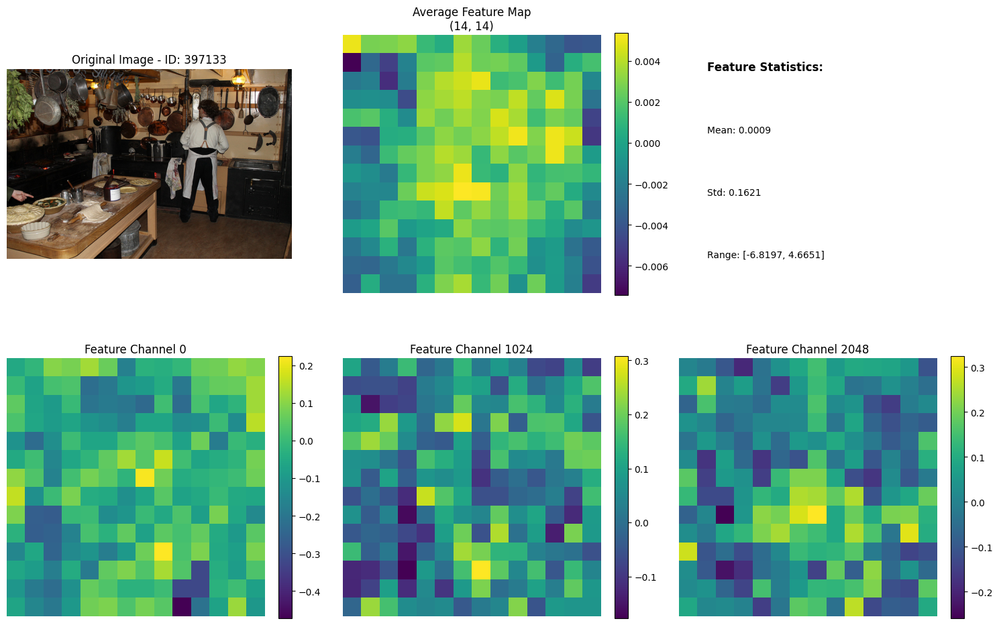


--- Attention Pattern Analysis ---
No attention weights available

--- Patch Similarity Analysis ---


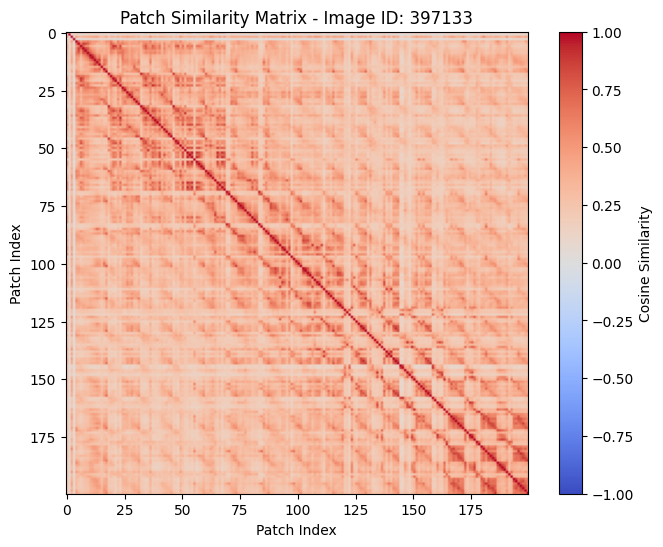


--- Detailed Statistics for Image 1 ---
Feature Statistics: {'mean': 0.0008617690182290971, 'std': 0.1620802879333496, 'min': -6.819714069366455, 'max': 4.665114402770996}
Average patch similarity: 0.3375
Patch similarity std: 0.1463
Pooled output norm: 7.9525
Hidden state norm: 147.0888

Processing Image 2 for DinoV3 Analysis
Image ID: 37777
Image size: (352, 230)
Hidden state shape: torch.Size([1, 201, 4096])
Pooled output shape: torch.Size([1, 4096])
Number of patches: 200

--- Feature Map Visualization ---


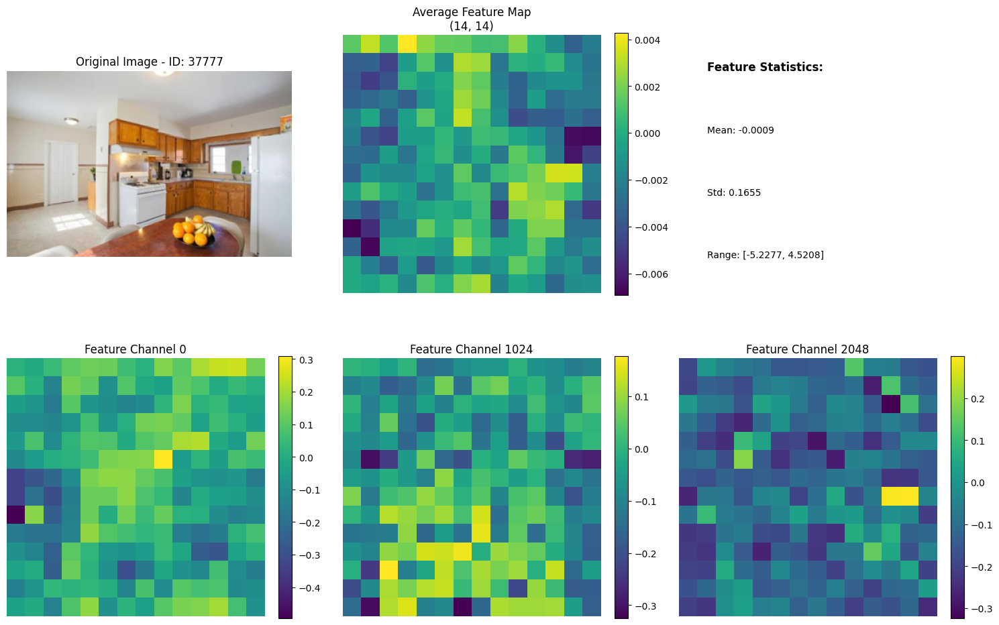


--- Attention Pattern Analysis ---
No attention weights available

--- Patch Similarity Analysis ---


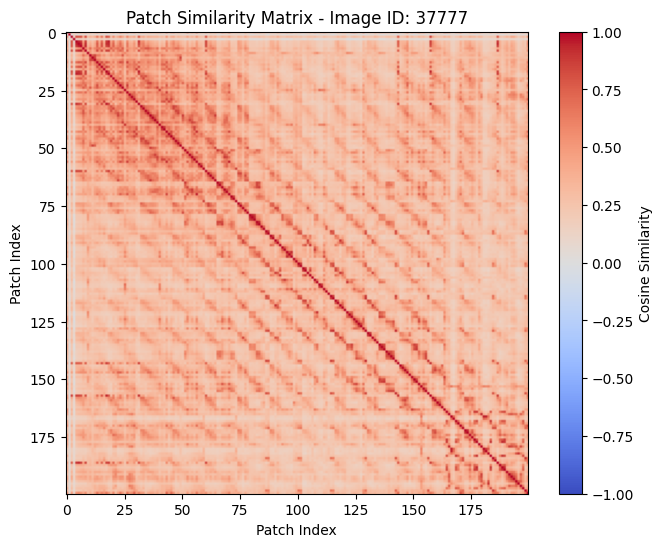


--- Detailed Statistics for Image 2 ---
Feature Statistics: {'mean': -0.0009425032767467201, 'std': 0.16549789905548096, 'min': -5.227718353271484, 'max': 4.520806312561035}
Average patch similarity: 0.3439
Patch similarity std: 0.1463
Pooled output norm: 7.0520
Hidden state norm: 149.7634

Processing Image 3 for DinoV3 Analysis
Image ID: 252219
Image size: (640, 428)
Hidden state shape: torch.Size([1, 201, 4096])
Pooled output shape: torch.Size([1, 4096])
Number of patches: 200

--- Feature Map Visualization ---


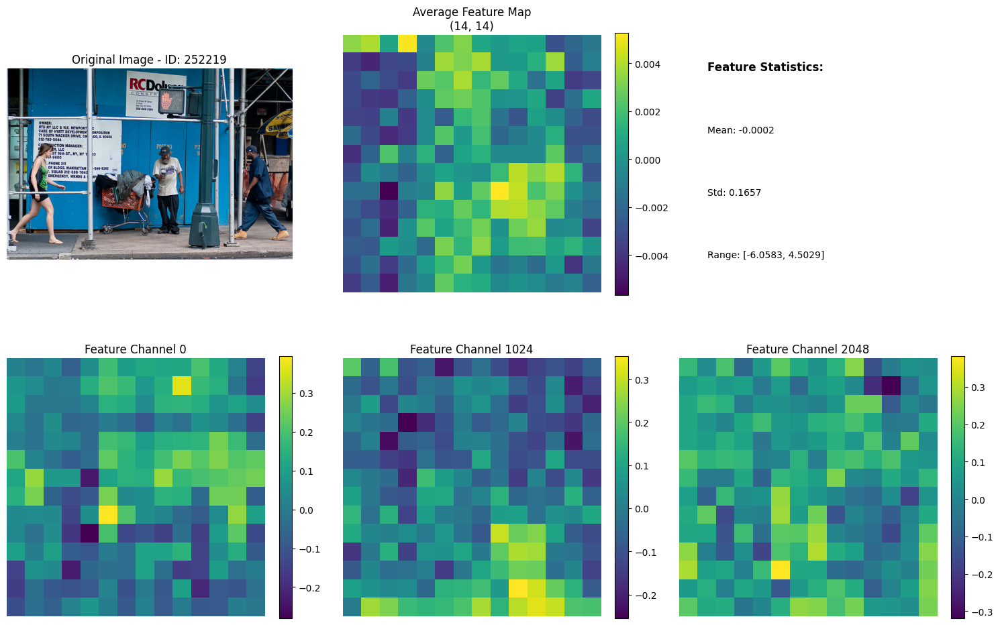


--- Attention Pattern Analysis ---
No attention weights available

--- Patch Similarity Analysis ---


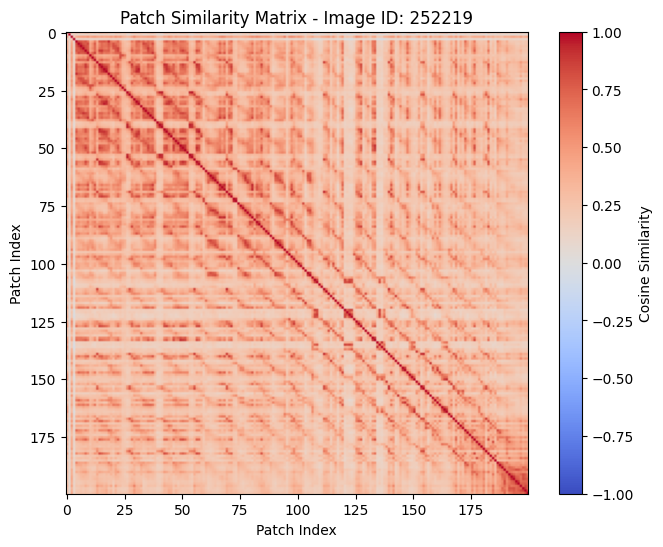


--- Detailed Statistics for Image 3 ---
Feature Statistics: {'mean': -0.0002389890723861754, 'std': 0.16571049392223358, 'min': -6.058320999145508, 'max': 4.502900123596191}
Average patch similarity: 0.3512
Patch similarity std: 0.1617
Pooled output norm: 7.6213
Hidden state norm: 150.0958

DinoV3 Detailed Analysis Complete

=== Model Comparison Summary ===
Faster R-CNN metrics not available for comparison

Note: These models serve different purposes:
- Faster R-CNN: Object detection with bounding boxes and class predictions
- DinoV3: Self-supervised feature extraction and representation learning

✓ Complete analysis finished successfully!


In [10]:
# DinoV3 Detailed Visualizations on Sample Images

print(f"\n=== DinoV3 Detailed Visualizations ===")
print("Showing feature analysis and attention patterns from the same 3 images used in Faster R-CNN...")

# Get the same sample images for visualization (first 3 images)
sample_indices = [0, 1, 2]  # Same as Faster R-CNN visualization

for idx in sample_indices:
    try:
        print(f"\n{'='*60}")
        print(f"Processing Image {idx + 1} for DinoV3 Analysis")
        print(f"{'='*60}")
        
        # Get image and target
        image_tensor, target = dataset_subset[idx]
        image_id = target['image_id'].item()
        
        # Convert tensor back to PIL Image for DinoV3 processor
        if isinstance(image_tensor, torch.Tensor):
            # Convert from [C, H, W] to [H, W, C] and scale to [0, 255]
            image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
            if image_np.max() <= 1.0:
                image_np = (image_np * 255).astype(np.uint8)
            else:
                image_np = image_np.astype(np.uint8)
            image_pil = Image.fromarray(image_np)
        
        print(f"Image ID: {image_id}")
        print(f"Image size: {image_pil.size}")
        
        # Perform DinoV3 inference for visualization
        with torch.no_grad():
            outputs = dinov3_inference(model, processor, image_pil)
        
        # Extract key information
        last_hidden_state = outputs['last_hidden_state']
        pooled_output = outputs['pooled_output']
        
        print(f"Hidden state shape: {last_hidden_state.shape}")
        print(f"Pooled output shape: {pooled_output.shape}")
        print(f"Number of patches: {last_hidden_state.shape[1] - 1}")  # -1 for CLS token
        
        # Visualize features
        print(f"\n--- Feature Map Visualization ---")
        feature_stats = visualize_dinov3_features(image_pil, outputs, image_id)
        
        # Visualize attention patterns
        print(f"\n--- Attention Pattern Analysis ---")
        analyze_dinov3_attention(outputs, image_id)
        
        # Additional patch similarity analysis
        print(f"\n--- Patch Similarity Analysis ---")
        patch_features = last_hidden_state[0, 1:, :]  # Remove CLS token
        patch_features_norm = torch.nn.functional.normalize(patch_features, p=2, dim=1)
        similarity_matrix = torch.mm(patch_features_norm, patch_features_norm.t())
        
        plt.figure(figsize=(8, 6))
        plt.imshow(similarity_matrix.cpu().numpy(), cmap='coolwarm', vmin=-1, vmax=1)
        plt.colorbar(label='Cosine Similarity')
        plt.title(f'Patch Similarity Matrix - Image ID: {image_id}')
        plt.xlabel('Patch Index')
        plt.ylabel('Patch Index')
        plt.show()
        
        # Print detailed statistics
        print(f"\n--- Detailed Statistics for Image {idx + 1} ---")
        print(f"Feature Statistics: {feature_stats}")
        print(f"Average patch similarity: {similarity_matrix.mean().item():.4f}")
        print(f"Patch similarity std: {similarity_matrix.std().item():.4f}")
        print(f"Pooled output norm: {torch.norm(pooled_output).item():.4f}")
        print(f"Hidden state norm: {torch.norm(last_hidden_state).item():.4f}")
        
        # Clean up memory
        del outputs, last_hidden_state, pooled_output, patch_features, similarity_matrix
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        
    except Exception as e:
        print(f"Error processing image {idx + 1}: {e}")
        continue

print(f"\n{'='*60}")
print(f"DinoV3 Detailed Analysis Complete")
print(f"{'='*60}")

# Comparison summary with Faster R-CNN
print(f"\n=== Model Comparison Summary ===")
if 'faster_rcnn_metrics' in locals():
    print(f"\nFaster R-CNN vs DinoV3 Performance:")
    print(f"Faster R-CNN - Avg time per image: {faster_rcnn_metrics['avg_time_per_image']:.3f}s")
    print(f"DinoV3 - Avg time per image: {dinov3_metrics['avg_time_per_image']:.3f}s")
    print(f"Speed ratio (Faster R-CNN / DinoV3): {faster_rcnn_metrics['avg_time_per_image'] / dinov3_metrics['avg_time_per_image']:.2f}x")
    
    print(f"\nMemory Usage Comparison:")
    print(f"Faster R-CNN - Peak GPU memory: {faster_rcnn_metrics['peak_gpu_memory']:.2f} MB")
    print(f"DinoV3 - Peak GPU memory: {dinov3_metrics['peak_gpu_memory']:.2f} MB")
    
    print(f"\nTask Comparison:")
    print(f"Faster R-CNN: Object Detection - {faster_rcnn_metrics['total_detections']} total detections")
    print(f"DinoV3: Feature Extraction - {dinov3_metrics['avg_num_patches']:.0f} patches per image")
else:
    print("Faster R-CNN metrics not available for comparison")

print(f"\nNote: These models serve different purposes:")
print(f"- Faster R-CNN: Object detection with bounding boxes and class predictions")
print(f"- DinoV3: Self-supervised feature extraction and representation learning")

print(f"\n✓ Complete analysis finished successfully!")

In [ ]:
# Clean up GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()
gc.collect()


NameError: name 'outputs' is not defined

## **DETR**

### Import DETR Model

In [ ]:
# Load model directly
# Documentation: https://huggingface.co/facebook/detr-resnet-50

print("=== Loading DETR Model ===")
print("Model: facebook/detr-resnet-50")

from transformers import AutoImageProcessor, AutoModelForObjectDetection

# Enable progress bars for transformers downloads
os.environ['HF_HUB_ENABLE_HF_TRANSFER'] = 'True'  # Faster downloads if available

print("\nDownloading DETR Image Processor...")

processor = AutoImageProcessor.from_pretrained("facebook/detr-resnet-50",
                                                   use_fast=True,
                                                   trust_remote_code=True)
model = AutoModelForObjectDetection.from_pretrained("facebook/detr-resnet-50",
                                                        trust_remote_code=True,
                                                        device_map="auto"
                                            
                                                        )

=== Loading DETR Model ===
Model: facebook/detr-resnet-50



Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Detections:
Detected remote with confidence 0.998 at location [40.16, 70.81, 175.55, 117.98]
Detected remote with confidence 0.996 at location [333.24, 72.55, 368.33, 187.66]
Detected couch with confidence 0.995 at location [-0.02, 1.15, 639.73, 473.76]
Detected cat with confidence 0.999 at location [13.24, 52.05, 314.02, 470.93]
Detected cat with confidence 0.999 at location [345.4, 23.85, 640.37, 368.72]


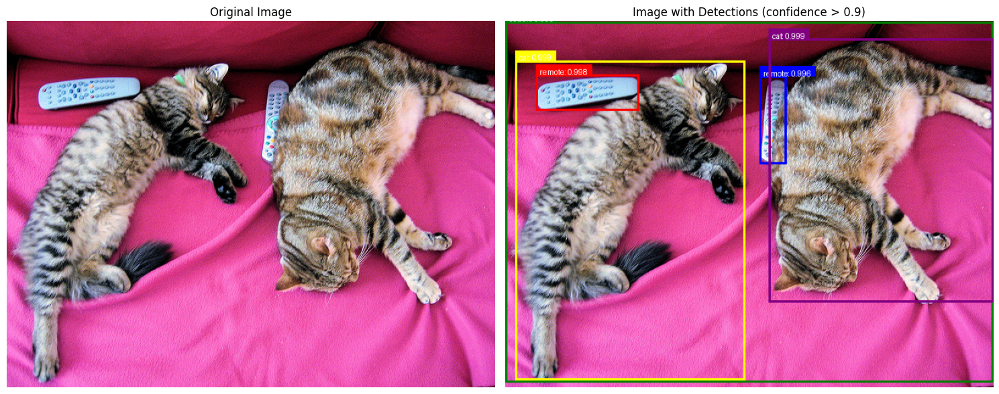


Image with detections saved as 'detection_results.jpg'


In [1]:
from transformers import DetrImageProcessor, DetrForObjectDetection
import torch
from PIL import Image, ImageDraw, ImageFont
import requests
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import font_manager

url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)

# you can specify the revision tag if you don't want the timm dependency
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50", revision="no_timm")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50", revision="no_timm")

inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs)

# convert outputs (bounding boxes and class logits) to COCO API
# let's only keep detections with score > 0.9
target_sizes = torch.tensor([image.size[::-1]])
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0]

# Create a copy of the image for drawing
image_with_boxes = image.copy()
draw = ImageDraw.Draw(image_with_boxes)

# Try to find a suitable font, fall back to default if not available
try:
    # Try to use a common font
    font = ImageFont.truetype("Arial.ttf", 15)
except:
    font = ImageFont.load_default()

# Define colors for different classes (you can customize this)
colors = ["red", "blue", "green", "yellow", "purple", "orange", "pink", "brown"]

print("Detections:")
for i, (score, label, box) in enumerate(zip(results["scores"], results["labels"], results["boxes"])):
    box = [round(i, 2) for i in box.tolist()]
    label_name = model.config.id2label[label.item()]
    confidence = round(score.item(), 3)
    
    print(f"Detected {label_name} with confidence {confidence} at location {box}")
    
    # Draw bounding box
    color = colors[i % len(colors)]
    draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline=color, width=3)
    
    # Draw label background
    label_text = f"{label_name}: {confidence}"
    text_bbox = draw.textbbox((0, 0), label_text, font=font)
    text_width = text_bbox[2] - text_bbox[0]
    text_height = text_bbox[3] - text_bbox[1]
    
    # Draw text background
    draw.rectangle([(box[0], box[1] - text_height - 5), 
                   (box[0] + text_width + 10, box[1])], fill=color)
    
    # Draw text
    draw.text((box[0] + 5, box[1] - text_height - 2), label_text, fill="white", font=font)

# Display using matplotlib for better visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

# Original image
ax1.imshow(image)
ax1.set_title('Original Image')
ax1.axis('off')

# Image with bounding boxes
ax2.imshow(image_with_boxes)
ax2.set_title('Image with Detections (confidence > 0.9)')
ax2.axis('off')

plt.tight_layout()
plt.show()

# Alternative: Save the image with bounding boxes
image_with_boxes.save("detection_results.jpg")
print("\nImage with detections saved as 'detection_results.jpg'")

## Perform Inference with DETR on Cocoa Dataset

In [ ]:
# Inference and Visualization Functtion

### Perform Inference and Measure Performance Metrics for DETR

### Import Grounding-DINO Model

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

/home/malneyugnfl/anaconda3/envs/huggingface/lib/python3.10/site-packages/transformers/models/grounding_dino/processing_grounding_dino.py:94: FutureWarning: The key `labels` is will return integer ids in `GroundingDinoProcessor.post_process_grounded_object_detection` output since v4.51.0. Use `text_labels` instead to retrieve string object names.
  warnings.warn(self.message, FutureWarning)


Detections:
Detected 'a cat' with confidence 0.402 at location [346.21, 22.19, 637.46, 374.67]
Detected 'a remote control' with confidence 0.441 at location [38.35, 70.11, 176.69, 117.92]
Detected 'a cat' with confidence 0.428 at location [10.2, 52.49, 316.93, 472.76]
Detected 'a remote control' with confidence 0.329 at location [332.08, 74.43, 371.09, 187.98]
Detected '' with confidence 0.253 at location [26.12, 54.98, 190.38, 134.33]

Creating visualizations...


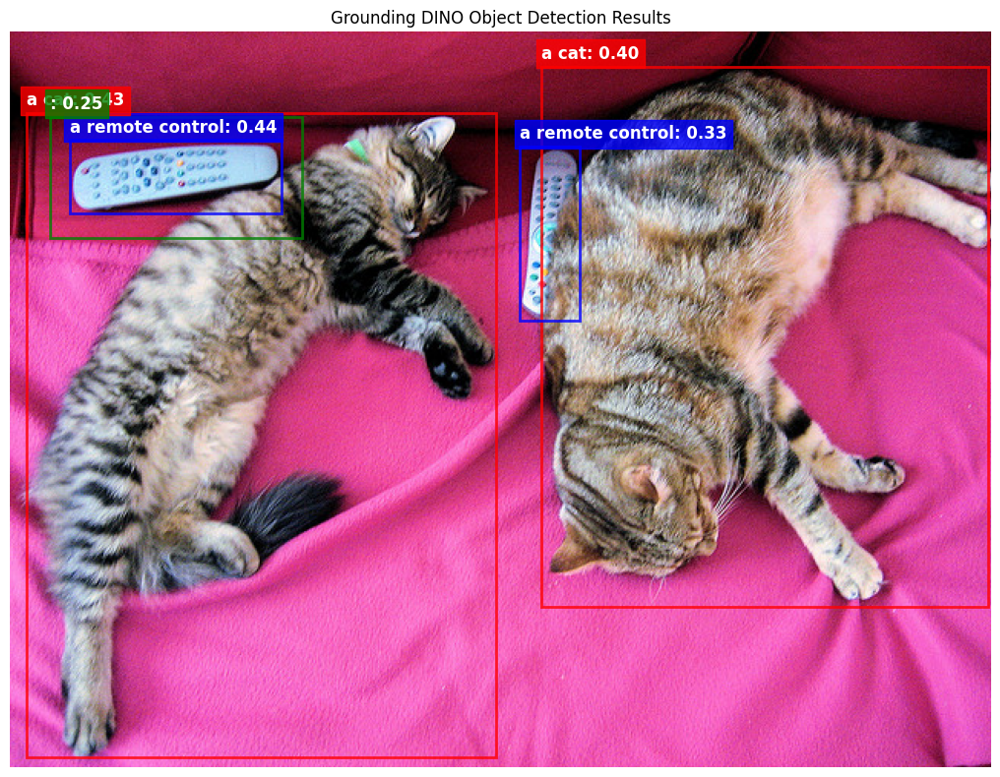

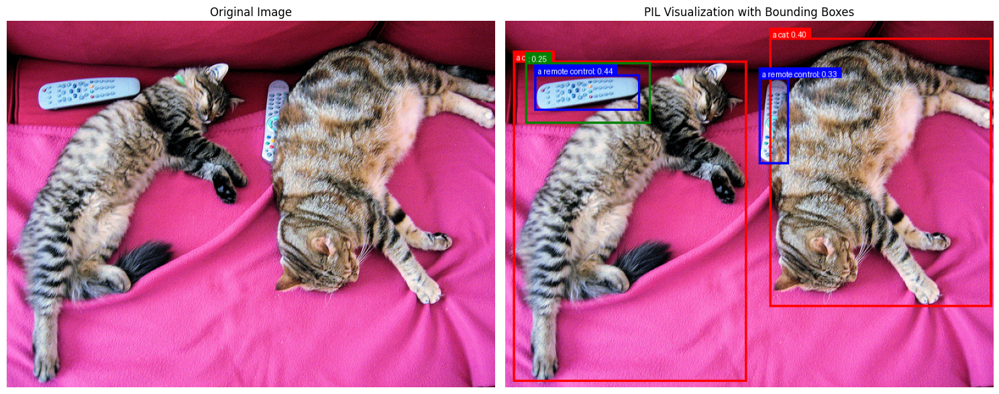

Detection results saved as 'grounding_dino_detections.jpg'

Summary: Found 5 detections
  - a remote control: 2 instances
  - : 1 instances
  - a cat: 2 instances


In [1]:
# Load Grounding DINO model with download progress and device management
# Documentation: https://huggingface.co/IDEA-Research/grounding-dino-base

import requests
import torch
from PIL import Image, ImageDraw, ImageFont
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection 
import matplotlib.pyplot as plt
import matplotlib.patches as patches

model_id = "IDEA-Research/grounding-dino-base"
device = "cuda" if torch.cuda.is_available() else "cpu"

processor = AutoProcessor.from_pretrained(model_id)
model = AutoModelForZeroShotObjectDetection.from_pretrained(model_id).to(device)

image_url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(image_url, stream=True).raw)
# Check for cats and remote controls
# VERY important: text queries need to be lowercased + end with a dot
text = "a cat. a remote control."

inputs = processor(images=image, text=text, return_tensors="pt").to(device)
with torch.no_grad():
    outputs = model(**inputs)

results = processor.post_process_grounded_object_detection(
    outputs,
    inputs.input_ids,
    # box_threshold=0.4,
    text_threshold=0.3,
    target_sizes=[image.size[::-1]]
)[0]

# Extract detections
boxes = results["boxes"]
scores = results["scores"]
labels = results["labels"]

print("Detections:")
for box, score, label in zip(boxes, scores, labels):
    box = [round(coord, 2) for coord in box.tolist()]
    print(f"Detected '{label}' with confidence {score:.3f} at location {box}")

# Visualization using PIL
def visualize_with_pil(image, boxes, scores, labels):
    """Visualize detections using PIL"""
    image_copy = image.copy()
    draw = ImageDraw.Draw(image_copy)
    
    # Define colors for different labels
    colors = {
        "a cat": "red",
        "a remote control": "blue",
        # Add more colors for other labels if needed
    }
    
    # Try to load a font, fall back to default if not available
    try:
        font = ImageFont.truetype("Arial.ttf", 20)
    except:
        font = ImageFont.load_default()
    
    for box, score, label in zip(boxes, scores, labels):
        # Convert box coordinates to integers
        box = [int(coord) for coord in box]
        
        # Get color for this label or use a default
        color = colors.get(label, "green")
        
        # Draw bounding box
        draw.rectangle([(box[0], box[1]), (box[2], box[3])], 
                      outline=color, width=3)
        
        # Create label text
        label_text = f"{label}: {score:.2f}"
        
        # Draw text background
        text_bbox = draw.textbbox((0, 0), label_text, font=font)
        text_width = text_bbox[2] - text_bbox[0]
        text_height = text_bbox[3] - text_bbox[1]
        
        draw.rectangle([(box[0], box[1] - text_height - 5),
                       (box[0] + text_width + 10, box[1])], 
                      fill=color)
        
        # Draw text
        draw.text((box[0] + 5, box[1] - text_height - 2), 
                 label_text, fill="white", font=font)
    
    return image_copy

# Visualization using matplotlib (more sophisticated)
def visualize_with_matplotlib(image, boxes, scores, labels):
    """Visualize detections using matplotlib"""
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)
    
    # Define colors for different labels
    colors = {
        "a cat": "red",
        "a remote control": "blue"
    }
    
    for box, score, label in zip(boxes, scores, labels):
        box = box.tolist()
        color = colors.get(label, "green")
        
        # Create rectangle patch
        rect = patches.Rectangle(
            (box[0], box[1]), 
            box[2] - box[0], 
            box[3] - box[1],
            linewidth=2, 
            edgecolor=color, 
            facecolor='none',
            alpha=0.8
        )
        
        # Add the patch to the Axes
        ax.add_patch(rect)
        
        # Add label
        ax.text(
            box[0], 
            box[1] - 5, 
            f"{label}: {score:.2f}", 
            bbox=dict(facecolor=color, alpha=0.8, edgecolor=color),
            fontsize=12, 
            color='white',
            weight='bold'
        )
    
    ax.set_title('Grounding DINO Object Detection Results')
    ax.axis('off')
    plt.tight_layout()
    return fig

# Create visualizations
print("\nCreating visualizations...")

# PIL visualization
image_with_boxes_pil = visualize_with_pil(image, boxes, scores, labels)

# Matplotlib visualization
fig = visualize_with_matplotlib(image, boxes, scores, labels)

# Display both visualizations
plt.figure(figsize=(15, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# PIL visualization
plt.subplot(1, 2, 2)
plt.imshow(image_with_boxes_pil)
plt.title('PIL Visualization with Bounding Boxes')
plt.axis('off')

plt.tight_layout()
plt.show()

# Also show the matplotlib visualization separately
plt.show()

# Save the results
image_with_boxes_pil.save("grounding_dino_detections.jpg")
print("Detection results saved as 'grounding_dino_detections.jpg'")

# Print summary
print(f"\nSummary: Found {len(boxes)} detections")
for label in set(labels):
    count = labels.count(label)
    print(f"  - {label}: {count} instances")


### Perform Inference and Measure Performance Metrics for Grounding-DINO